<a href="https://colab.research.google.com/github/mraslann/Augmented-reality-and-image-mosaics/blob/main/Vision_Assignment2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Part 1

## Dependencies

In [ ]:
import numpy as np
import cv2 as cv
from google.colab.patches import cv2_imshow
from tqdm import tqdm
import math

## Reading video 

In [ ]:
def loadVid(path):
	# Create a VideoCapture object and read from input file
	# If the input is the camera, pass 0 instead of the video file name
	cap = cv.VideoCapture(path)
	 
	# Check if camera opened successfully
	if not cap.isOpened(): 
		print("Error opening video stream or file")

	i = 0
	# Read until video is completed
	while(cap.isOpened()):
		# Capture frame-by-frame
		i += 1
		ret, frame = cap.read()
		if ret == True:

			#Store the resulting frame
			if i == 1:
				frames = frame[np.newaxis, ...]
			else:
				frame = frame[np.newaxis, ...]
				frames = np.vstack([frames, frame])
				frames = np.squeeze(frames)
			
		else: 
			break
	 
	# When everything done, release the video capture object
	cap.release()

	return frames


## Match the cover with each video frame

In [ ]:
bookvid = loadVid('/content/book.mov')

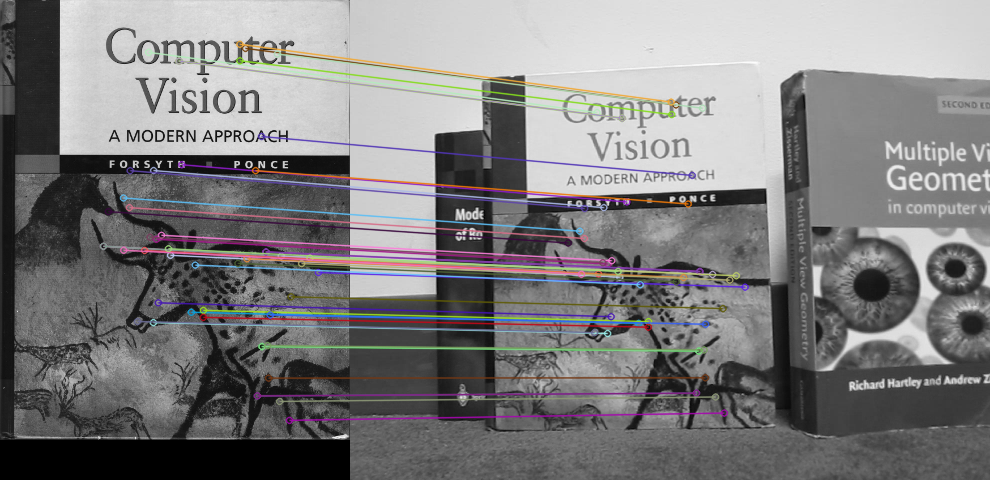

In [ ]:
img1 = cv.cvtColor(bookvid[-1], cv.COLOR_BGR2GRAY)
cover=cv.imread('/content/cv_cover.jpg', cv.COLOR_BGR2GRAY)
sift = cv.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(cover,None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img1,None)

bf = cv.BFMatcher()
matches = bf.knnMatch(descriptors_1,descriptors_2,k=2)
good = []
for m,n in matches:
    if m.distance < 0.7*n.distance:
        good.append((m,m.distance))
good = sorted(good, key = lambda x:x[1])
good=[[m] for m,n in good]
img3 = cv.drawMatchesKnn(cover,keypoints_1,img1,keypoints_2,good[:50],None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
cv2_imshow(img3)

In [ ]:
src_pts = np.float32([ keypoints_1[m[0].queryIdx].pt for m in good ]).reshape(-1,1,2)
dst_pts = np.float32([ keypoints_2[m[0].trainIdx].pt for m in good ]).reshape(-1,1,2)
M, _ = cv.findHomography(src_pts, dst_pts)
h,w = cover.shape
pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
dst = cv.perspectiveTransform(pts,M)
img1 = cv.polylines(img1,[np.int32(dst)],True,255,3, cv.LINE_AA)

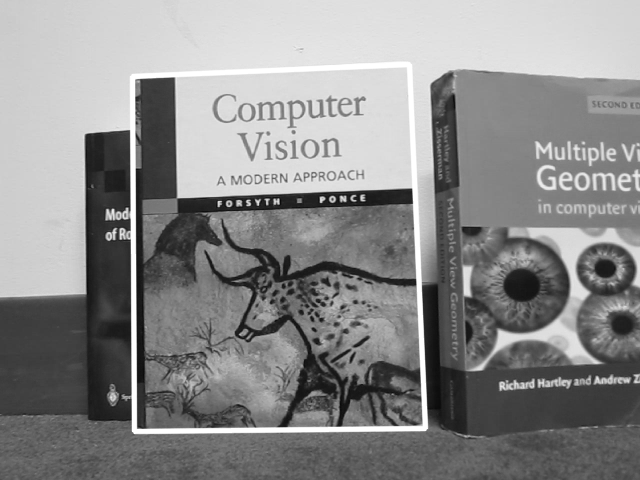

In [ ]:
cv2_imshow(img1)

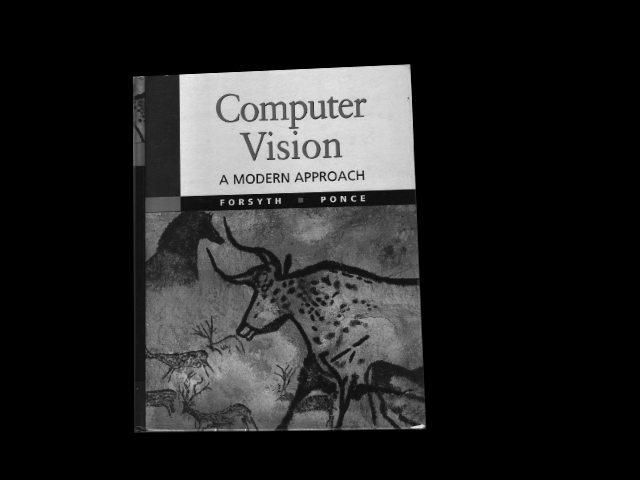

In [ ]:
result = cv.warpPerspective(cover,M,(img1.shape[1],img1.shape[0]))
cv2_imshow(result)

## Crop video frames

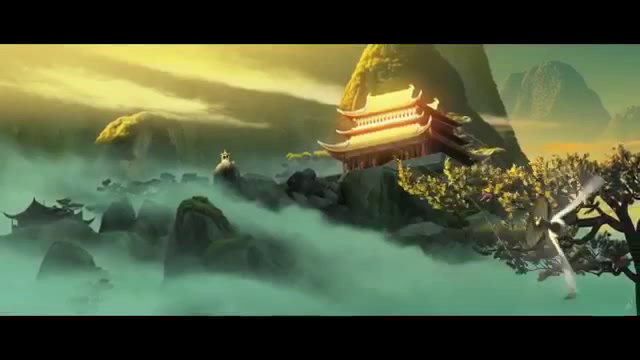

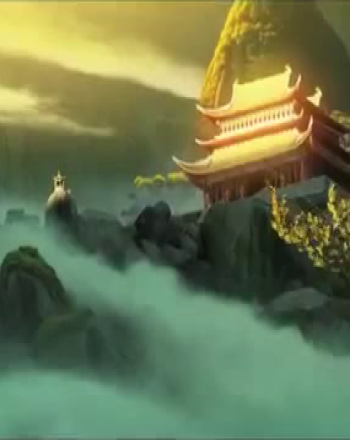

In [ ]:
sourceVid = loadVid('/content/ar_source.mov')
cv2_imshow(sourceVid[0])
hc,wc=cover.shape
h,w= sourceVid[0].shape[:2]
W,w=int(wc/hc*h),int(w)
cropped=np.array(list(map(lambda x: cv.resize(x[44:h-44, (w)//2-W//2: w//2+(W)//2-1], (wc,hc), interpolation = cv.INTER_AREA),sourceVid)))
cv2_imshow(cropped[0])

## play the video inside the book

In [ ]:
def wrap(frame,img):
  final=np.copy(frame)
  framecp=np.copy(frame)
  framecp=cv.cvtColor(framecp, cv.COLOR_BGR2GRAY)
  keypoints_1, descriptors_1 = sift.detectAndCompute(cover,None)
  keypoints_2, descriptors_2 = sift.detectAndCompute(framecp,None)
  bf = cv.BFMatcher()
  matches = bf.knnMatch(descriptors_1,descriptors_2,k=2)
  good = []
  for m,n in matches:
      if m.distance < 0.7*n.distance:
          good.append([m])
  src_pts = np.float32([ keypoints_1[m[0].queryIdx].pt for m in good ]).reshape(-1,1,2)
  dst_pts = np.float32([ keypoints_2[m[0].trainIdx].pt for m in good ]).reshape(-1,1,2)
  M, mask = cv.findHomography(src_pts, dst_pts)
  res= cv.warpPerspective(img,M,(framecp.shape[1],framecp.shape[0]))
  h,w = cover.shape[:2]
  pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
  dst = cv.perspectiveTransform(pts,M)
  cv.fillConvexPoly(final, np.int32(dst), 0, 16)
  return final
def wrapd(frame,img):
  final=np.copy(frame)
  framecp=np.copy(frame)
  framecp=cv.cvtColor(framecp, cv.COLOR_BGR2GRAY)
  keypoints_1, descriptors_1 = sift.detectAndCompute(cover,None)
  keypoints_2, descriptors_2 = sift.detectAndCompute(framecp,None)
  bf = cv.BFMatcher()
  matches = bf.knnMatch(descriptors_1,descriptors_2,k=2)
  good = []
  for m,n in matches:
      if m.distance < 0.7*n.distance:
          good.append([m])
  src_pts = np.float32([ keypoints_1[m[0].queryIdx].pt for m in good ]).reshape(-1,1,2)
  dst_pts = np.float32([ keypoints_2[m[0].trainIdx].pt for m in good ]).reshape(-1,1,2)
  M, mask = cv.findHomography(src_pts, dst_pts)
  res= cv.warpPerspective(img,M,(framecp.shape[1],framecp.shape[0]))
  h,w = cover.shape[:2]
  pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
  dst = cv.perspectiveTransform(pts,M)
  cv.fillConvexPoly(final, np.int32(dst), 0, 16)
  return res

In [ ]:
writer = cv.VideoWriter("outputvideo1.mp4", cv.VideoWriter_fourcc(*"mp4v"), 30,(bookvid[0].shape[1],bookvid[0].shape[0]))
writer1 = cv.VideoWriter("outputvideo2.mp4", cv.VideoWriter_fourcc(*"mp4v"), 30,(bookvid[0].shape[1],bookvid[0].shape[0]))
count=min(len(cropped),len(bookvid))
for i in tqdm(range(count)):
  writer.write(wrap(bookvid[i],cropped[i]))
  writer1.write(wrapd(bookvid[i],cropped[i]))
writer.release()

100%|██████████| 511/511 [05:00<00:00,  1.70it/s]


#Part 2

In [ ]:
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import cv2

def correspondence(img1, img2):
  cv2_imshow(img1)
  cv2_imshow(img2)

  sift = cv2.xfeatures2d.SIFT_create()

  keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
  keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)

  bf = cv2.BFMatcher()
  matches = bf.knnMatch(descriptors_1,descriptors_2,k=2)
  # Apply ratio test
  good = []
  for m,n in matches:
      if m.distance < 0.5*n.distance:
          good.append((m,m.distance))
  good = sorted(good, key = lambda x:x[1])
  good=[[m] for m,n in good]
  # cv.drawMatchesKnn expects list of lists as matches.
  img3 = cv2.drawMatchesKnn(img1,keypoints_1,img2,keypoints_2,good[:50],None,flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
  cv2_imshow(img3)
  return keypoints_1, keypoints_2, m, good

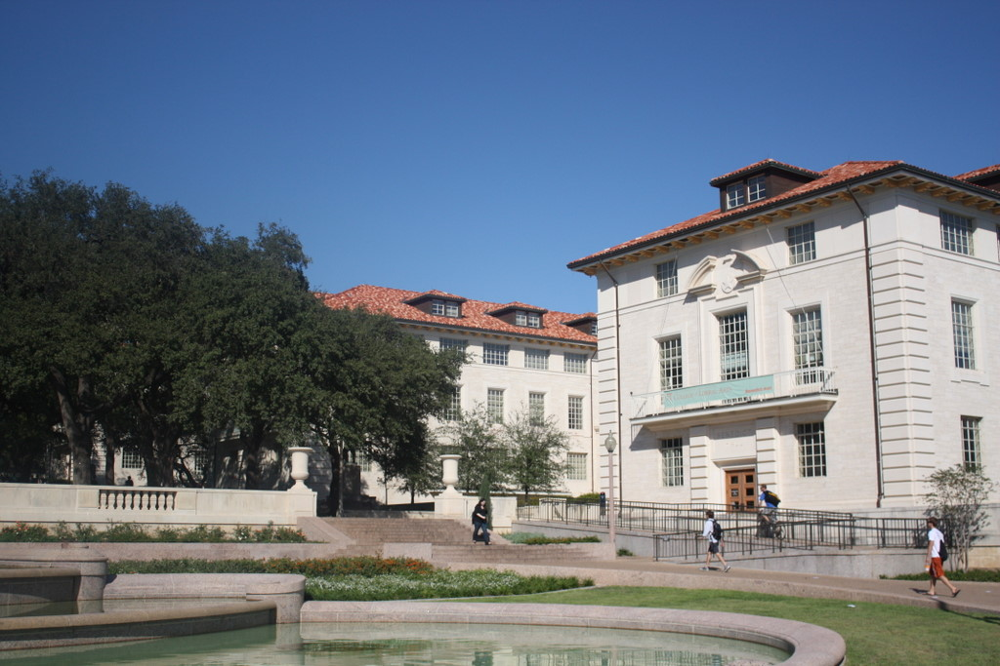

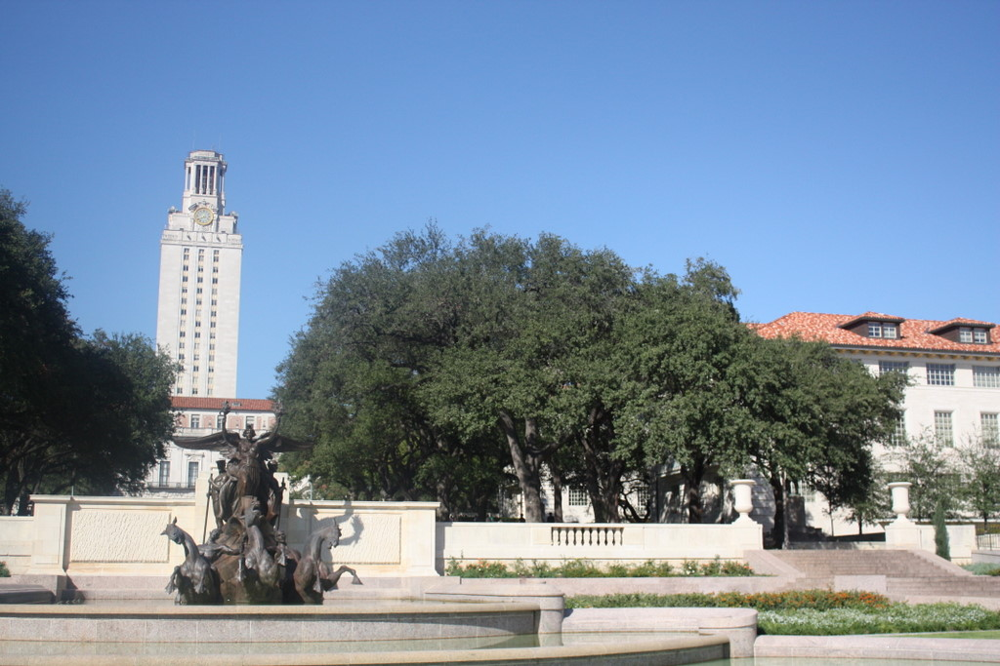

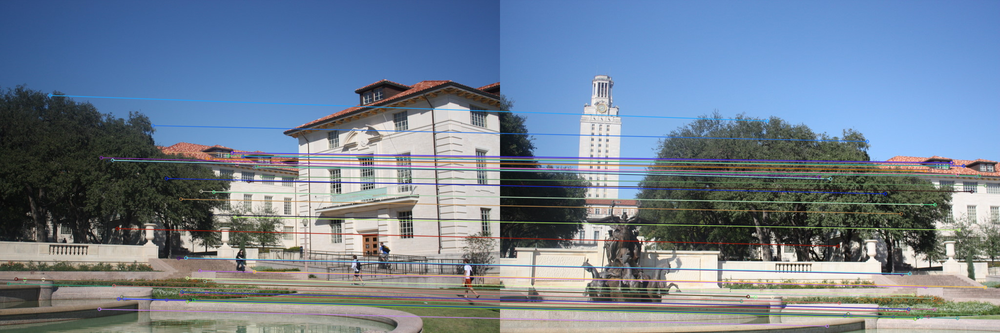

In [ ]:
img1 = cv2.imread("image1.jpg")
img2 = cv2.imread("image2.jpg")
keypoints_1, keypoints_2, m, good = correspondence(img1, img2)

In [ ]:
def calcHMatrix(src_pts,dst_pts):
  A = np.zeros((2*len(src_pts),9))
  k = 0
  for i in range(len(src_pts)):
    x = src_pts[i][0]
    y = src_pts[i][1]
    xdash = dst_pts[i][0]
    ydash = dst_pts[i][1]
    A[k] = [-x, -y, -1, 0, 0, 0, x*xdash, y*xdash, xdash]
    A[k+1] = [0, 0, 0, -x, -y, -1,x*ydash, y*ydash, ydash]
    k = k + 2
  U,segma,VT = np.linalg.svd(A)
  H = np.reshape(VT[-1:],(3,3))
  H = H/H[2][2]
  return H

In [ ]:
src_pts = np.int32([ keypoints_1[m[0].queryIdx].pt for m in good[:4] ])
dst_pts = np.int32([ keypoints_2[m[0].trainIdx].pt for m in good[:4] ])
H = calcHMatrix(src_pts, dst_pts)
H

array([[ 7.13842070e-01,  5.06927165e-02,  4.49933241e+02],
       [-1.64096291e-01,  9.07008199e-01,  8.33141247e+01],
       [-2.58508030e-04, -1.96786785e-05,  1.00000000e+00]])

In [ ]:
M, mask = cv2.findHomography(src_pts, dst_pts)
M

array([[ 7.13842070e-01,  5.06927165e-02,  4.49933241e+02],
       [-1.64096291e-01,  9.07008199e-01,  8.33141247e+01],
       [-2.58508030e-04, -1.96786785e-05,  1.00000000e+00]])

In [ ]:
def getValues(img,H):
  coords = dict()
  minX = math.inf
  minY = math.inf
  maxX = -1 * math.inf
  maxY = -1 * math.inf
  for row in range(img.shape[0]):
    for col in range(img.shape[1]):
      homgCoords = np.array([(col, row, 1)]).T
      transformedCoords = H.dot(homgCoords)
      transformedCoords = transformedCoords/transformedCoords[2];
      newX, newY = int(transformedCoords[0]),int(transformedCoords[1])
      coords[row,col]=np.array([(newX, newY)])
      minX = min(minX, newX)
      minY = min(minY, newY)
      maxX = max(maxX, newX)
      maxY = max(maxY, newY)
  return minX, minY, maxX,maxY, coords

In [ ]:
def warpingImage(img, H, nChannels=3):
  minX, minY, maxX, maxY, coords = getValues(img,H)
  shiftX = minX * -1
  shiftY = minY * -1
  warpedImage = np.zeros(((maxY - minY ) + 2, (maxX - minX) + 2, nChannels, 2))
  returnImage = np.zeros(((maxY - minY ) + 2, (maxX - minX) + 2, nChannels))
  returnImage1 = np.zeros((maxY + shiftY + 3, maxX + 2 , nChannels))
  print(returnImage1.shape)
  for row in range(img.shape[0]):
    for col in range(img.shape[1]):
      newX, newY = coords[row,col][0][0], coords[row,col][0][1]
      returnImage1[newY][newX] =  img[row][col]
      newY += shiftY
      newX += shiftX
      returnImage[newY][newX]  = img[row][col]

  inv_Homography = np.linalg.inv(H)
  for row in range(returnImage1.shape[0]):
    for col in range(returnImage1.shape[1]):
      if returnImage1[row][col].all() == 0:
        homgCoords = np.array([(col, row, 1)]).T
        transformedCoords = inv_Homography.dot(homgCoords)
        transformedCoords = transformedCoords/transformedCoords[2]
        newX, newY = int(transformedCoords[0]),int(transformedCoords[1])
        if 0 <= newX < img.shape[1] and 0 <= newY < img.shape[0] :
          returnImage1[row][col]  = img[newY][newX]
          # returnImage[row][col + shiftX] = img[newY][newX]
  returnImage1 = np.roll(returnImage1, 1*shiftY - 1, axis=0)
  returnImage1 = np.roll(returnImage1, 1*shiftX, axis=1)
  returnImage1 = returnImage1[: maxY + shiftY , :maxX - minX]
  return shiftX, shiftY, returnImage1.astype(np.uint8)

(821, 1654, 3)


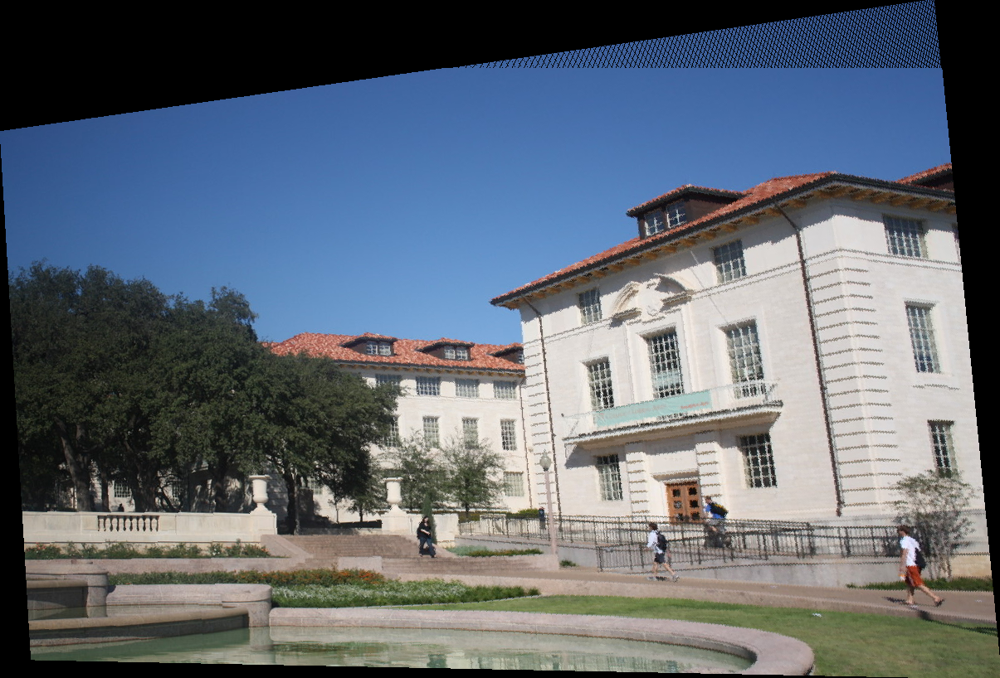

In [ ]:
shiftX, shiftY, warped_img = warpingImage(img1, H)
# warped_img = warped_img[shiftY:,:]
cv2_imshow(warped_img)

In [ ]:
def stitchImages(origImg, transformedImg, shiftX, shiftY, nChannels = 3):
  newImg = np.zeros(((origImg.shape[0] + transformedImg.shape[0]), (origImg.shape[1] + transformedImg.shape[1]), nChannels))
  newImg[0:transformedImg.shape[0],0:transformedImg.shape[1]] = transformedImg
  for row in range(origImg.shape[0]):
    for col in range(origImg.shape[1]):
      newX, newY = col + shiftX , row + shiftY
      newImg[newY][newX] = origImg[row][col]
  # delete black rows & columns
  idx = np.argwhere(np.all(newImg[..., :] == 0, axis=0))
  newImg = np.delete(newImg, idx, axis=1)
  idx = np.argwhere(np.all(newImg[..., :] == 0, axis=1))
  newImg = np.delete(newImg, idx, axis=0)
  # rotate image columns if shift was -ve 
  if shiftX < 0:
    newImg = np.roll(newImg, -1* shiftX, axis=1)
  if shiftY < 0:
    newImg = np.roll(newImg, -1* shiftY, axis=0) 
  return newImg.astype(np.uint8)

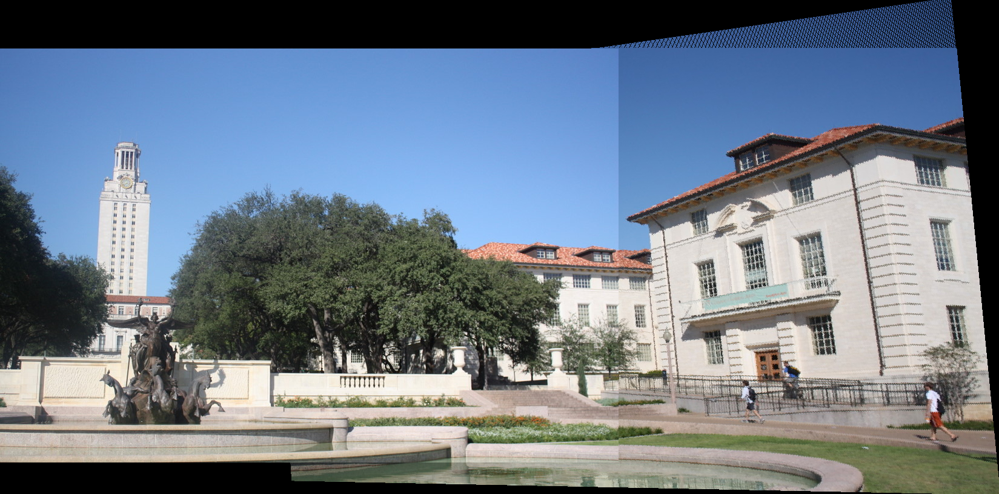

In [ ]:
outputImg = stitchImages(img2, warped_img, shiftX, shiftY)
cv2_imshow(outputImg)

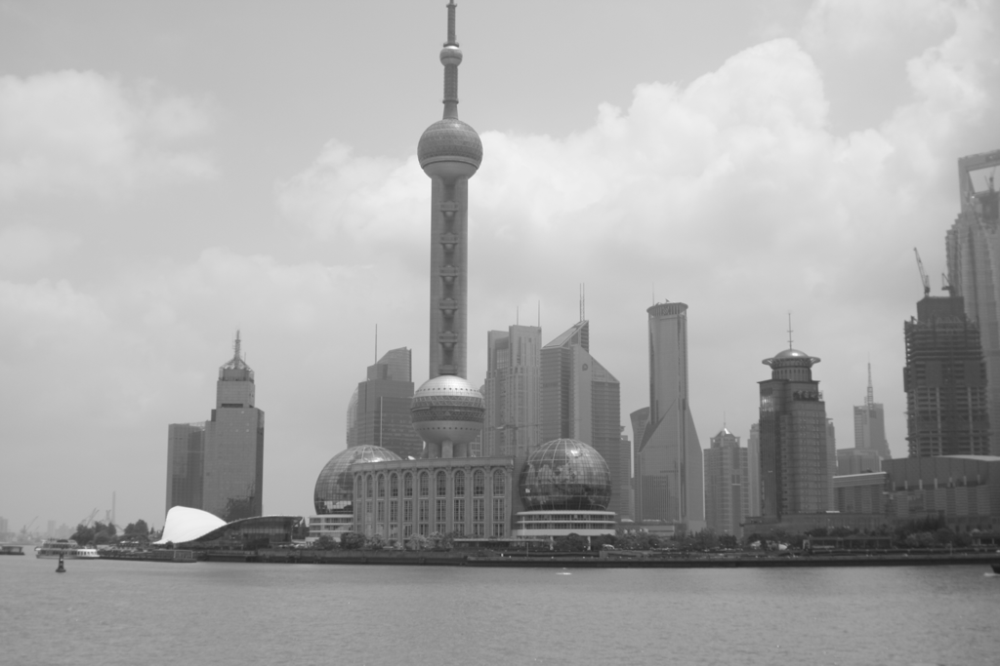

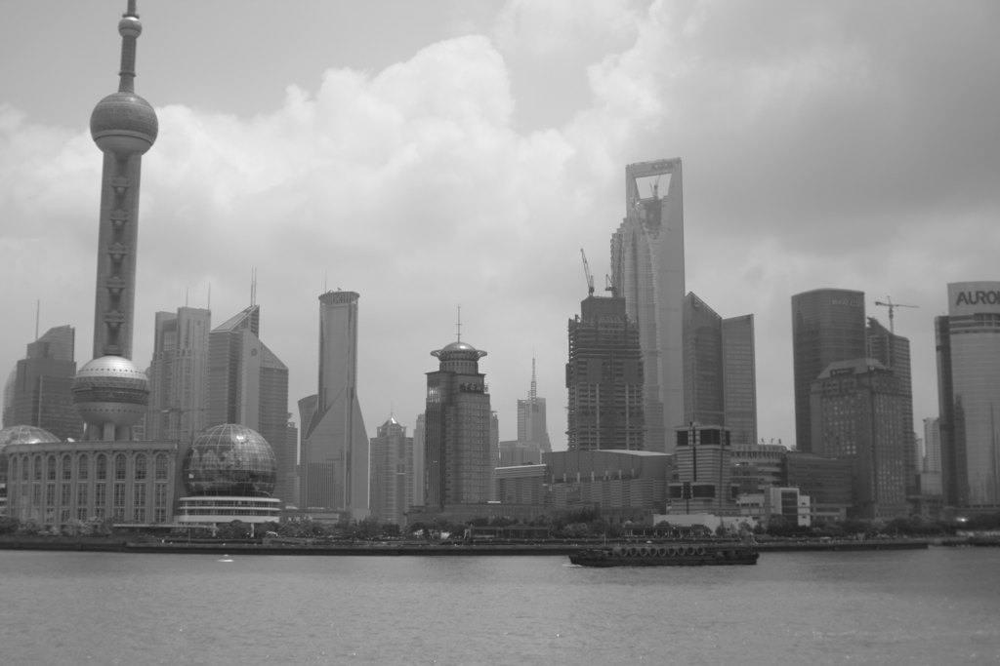

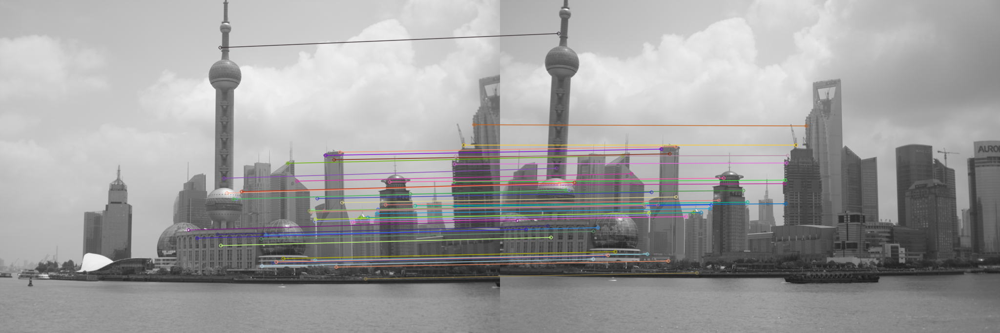

In [ ]:
bonus_img1 = cv2.imread("shanghai-21.png")
bonus_img3 = cv2.imread("shanghai-23.png")
keypoints_1, keypoints_2, m, good = correspondence(bonus_img1, bonus_img3)

In [ ]:
src_pts = np.int32([ keypoints_1[m[0].queryIdx].pt for m in good[:5] ])
dst_pts = np.int32([ keypoints_2[m[0].trainIdx].pt for m in good[:5] ])
H = calcHMatrix(src_pts, dst_pts)
H

array([[ 1.10992239e+00, -3.58967864e-02, -3.71253111e+02],
       [ 7.50918004e-02,  1.09385658e+00, -6.83727369e+01],
       [ 1.02661681e-04,  3.56560296e-05,  1.00000000e+00]])

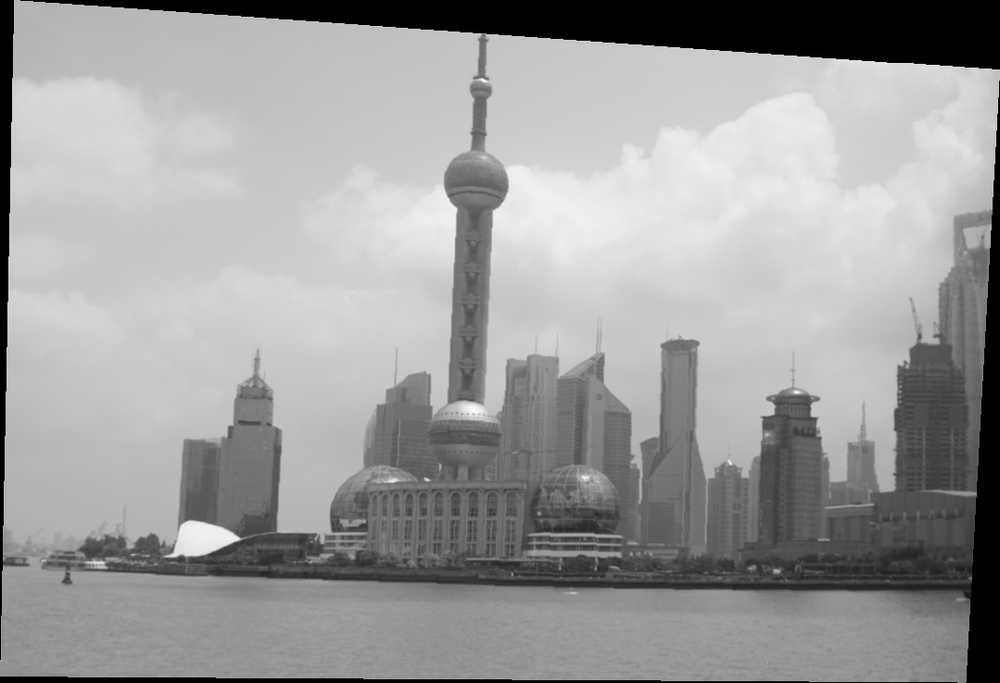

In [ ]:
shiftY, shiftX, warped_img = warpingImage(bonus_img1, H)
cv2_imshow(warped_img)

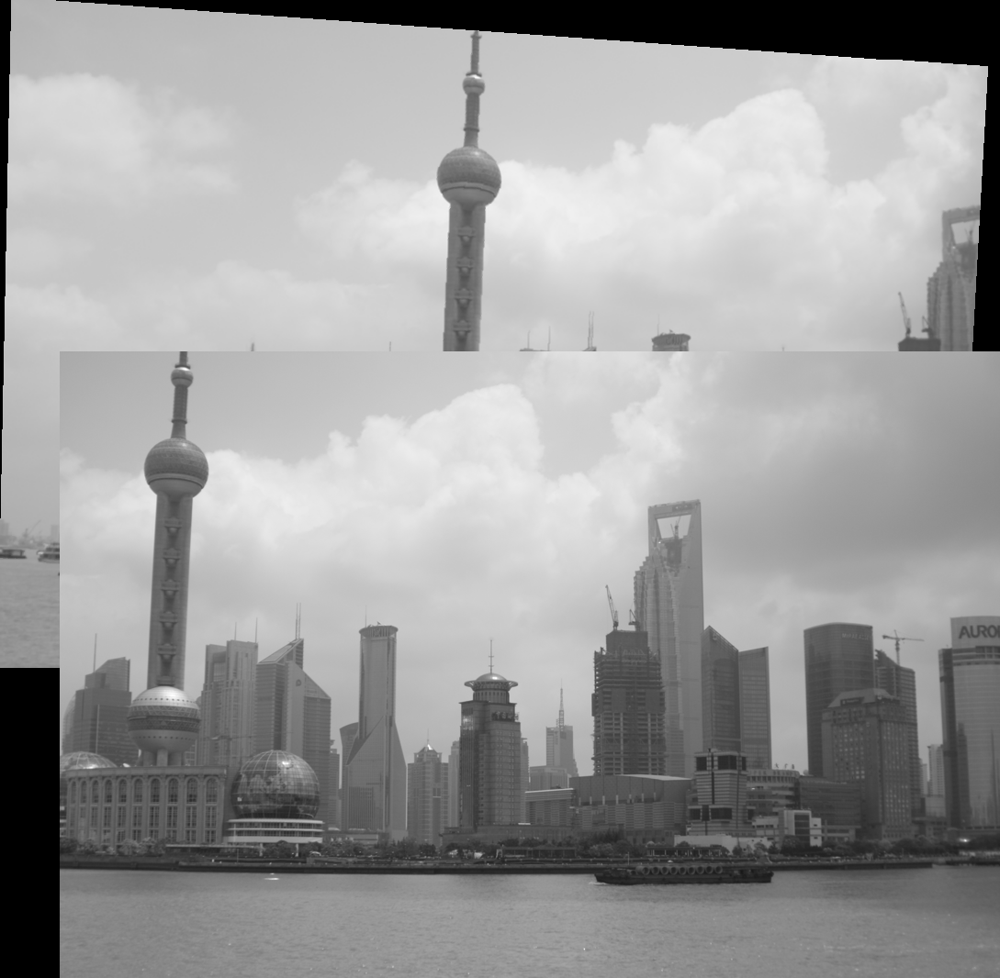

In [ ]:
outputImg = stitchImages(bonus_img3, warped_img, shiftX, shiftY)
cv2_imshow(outputImg)

In [ ]:
cv2.imwrite("output_bonus.png", outputImg)
output_bonus_img = cv2.imread("output_bonus.png")
bonus_img3 = cv2.imread("shanghai-23.png")
keypoints_1, keypoints_2, m, good = correspondence(output_bonus_img, bonus_img3)

In [ ]:
src_pts = np.int32([ keypoints_1[m[0].queryIdx].pt for m in good[:4] ])
dst_pts = np.int32([ keypoints_2[m[0].trainIdx].pt for m in good[:4] ])
H = calcHMatrix(src_pts, dst_pts)
H

array([[-1.95032776e-01, -5.70965517e-01,  5.86000000e+02],
       [-1.10829205e-01, -3.24456514e-01,  3.33000000e+02],
       [-3.32820436e-04, -9.74343886e-04,  1.00000000e+00]])

In [ ]:
shiftY, shiftX, warped_img = warpingImage(output_bonus_img, H)

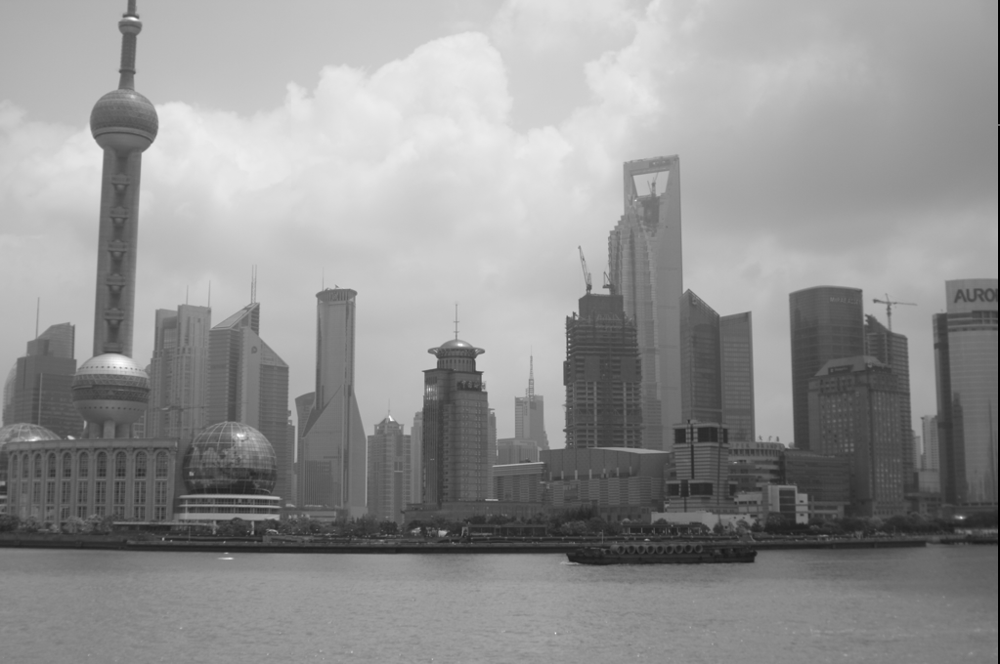

In [ ]:
outputImg = stitchImages(bonus_img3, warped_img, shiftX, shiftY)
cv2_imshow(outputImg)